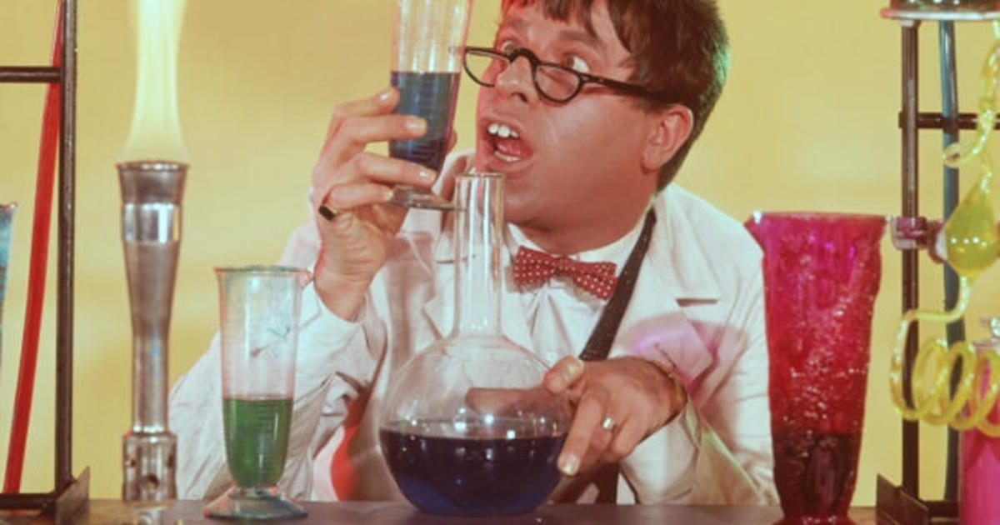

# Project: The Big Screen Analysis!

## Reviewing movies from 1960 to 2015

## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions</a></li>
</ul>

*It's a story of data. A story of intrigue, mystery, adventure! Watch as our hero travels the depths of data in search of meaning and glory! Will he succeed or will he fall to the perils of python, null values or the sinister erroneous data? Coming to a screen in front of you!*

<a id='intro'></a>
# Introduction

Using Udacity's file, tmdb-movies.csv, which is somewhat different than Kaggle's tmdb_5000_movies.csv (differences noted below), **what can we find that determines a "good" film from a "not-so-good" film? What questions arise from the data and how does that paint a picture of the quality of a film to the public?** (I choose Udacity's file over Kaggle's simply because, why not? It's data and let's see what it shows us.)


>Differences:
- Missing columns compared to Kaggle:
    - original_language
    - production_countries
    - spoken_languages
    - status
- Columns not in the Kaggle file:
    - imdb_id
    - budget_adj*
    - revenue_adj*

**Since there is no data dictionary easily avialable, these may be figures to adjust for inflation. It is not clear if TMDB adjusts its currency values already. I suspect not and will not use these.*

## A brief mention about themoviedb.org (TMDB)

Putting context for the data, what is TMDB and what does this data mean, especially for movies *before* the age of the internet and digital data collection (pre-2000)? (https://www.themoviedb.org/about?language=en-US)

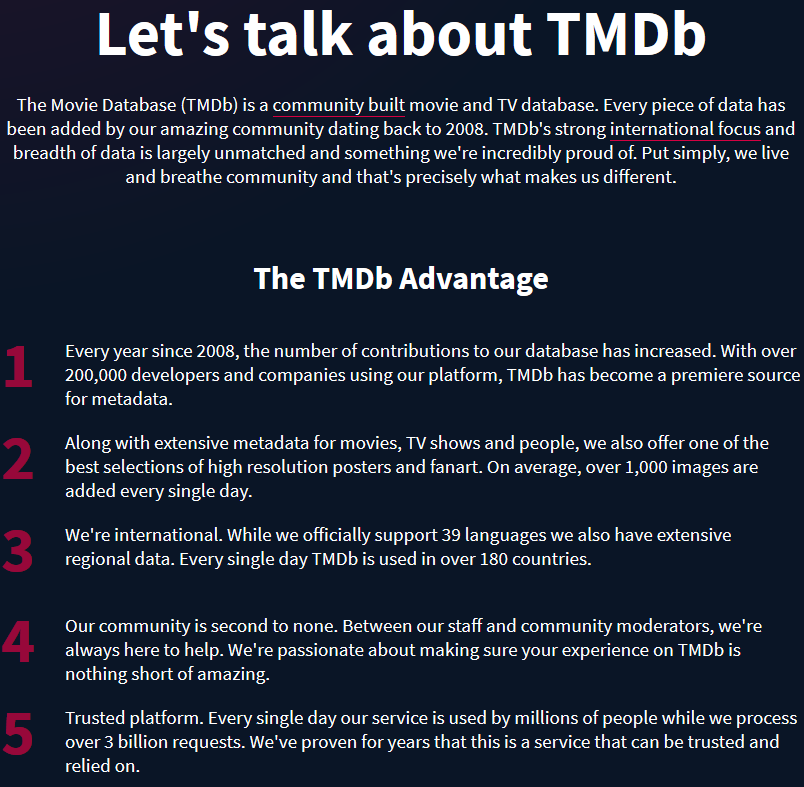

Okay, but what data is loaded about these movies? How is it being used? Let's use an example of one my [all-time favorites](https://www.themoviedb.org/movie/15788-the-bellboy?language=en-US)!

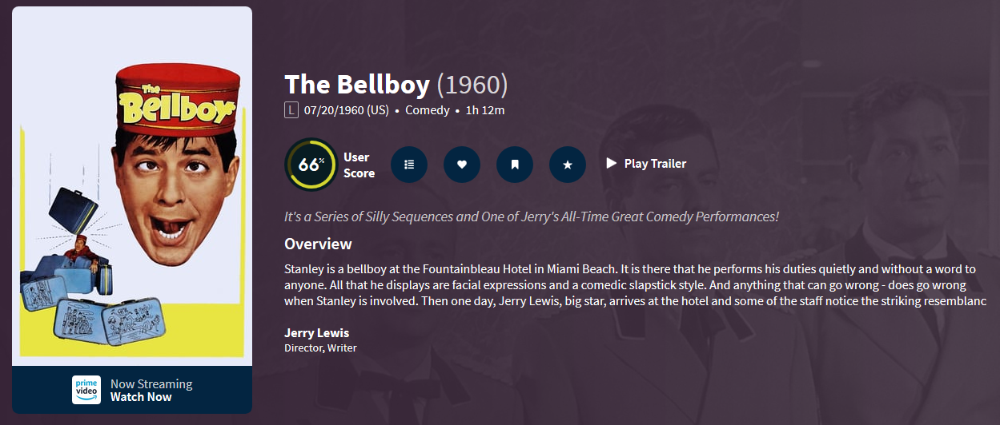

Interesting. So, here's the original_title, release_date, genre, runtime, tagline, overview, director, and there's a "user score."

If we click on the user score, we can see a little more detail of what this means:

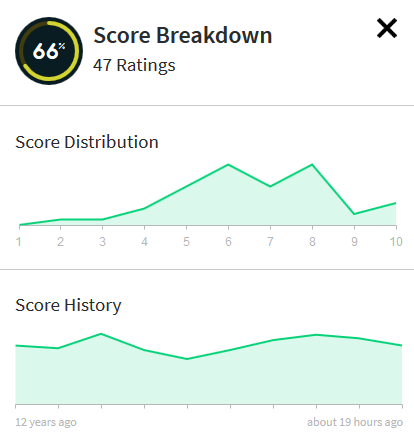

So out of 47 ratings (or vote_count 1-10), this yields a 66% (popularity?) or a 6.6 (vote_average) in a scale of 10.

Definitely a fancy display for the cast:

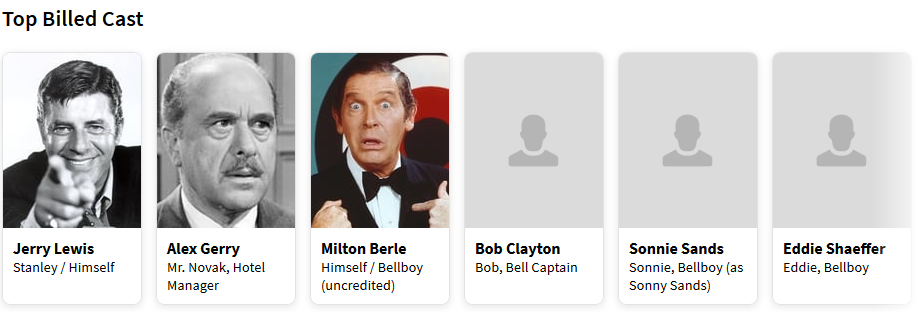


And here are some more of our attributes, sans status and original_language:

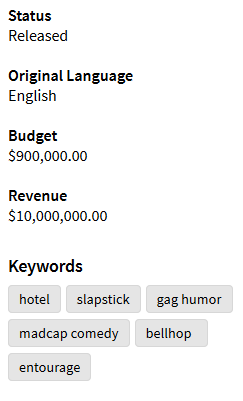

With 900K for a budget and 10M for the revenue (box-office sales), this seems like 1960s numbers, but it's not very obvious if it is. Without more clarity of adjusted values, I still see no added value to have these and will stick with original figures since that tends to be a norm in regular conversation.

This pretty much covers the breadth of our dataset, which gives us a little more context of what seems important in our data and what could be discarded. *Let's dig in!*

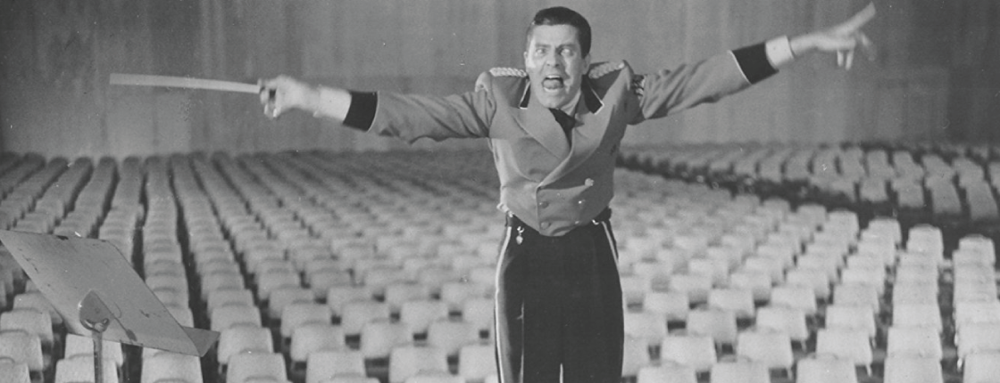

<a id='wrangling'></a>
## Data Wrangling

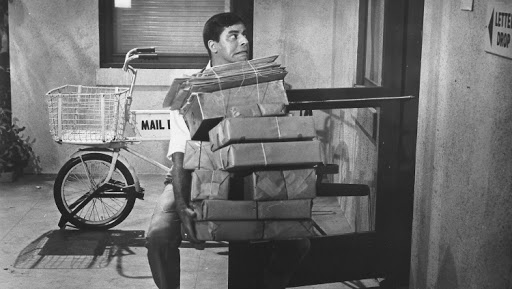

### Load some packages and review our data

In [1]:
# Concessions - "Let's all go to the lobby and get ourselves a treat!"
import pandas as pd
import numpy as np
import datetime
from matplotlib import pyplot as plt 

In [2]:
# A sneak peak! Let's see some previews!
df = pd.read_csv('tmdb-movies.csv')
df.head()

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,...,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
0,135397,tt0369610,32.985763,150000000,1513528810,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,http://www.jurassicworld.com/,Colin Trevorrow,The park is open.,...,Twenty-two years after the events of Jurassic ...,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,6/9/15,5562,6.5,2015,1.379999e+08,1.392446e+09
1,76341,tt1392190,28.419936,150000000,378436354,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,http://www.madmaxmovie.com/,George Miller,What a Lovely Day.,...,An apocalyptic story set in the furthest reach...,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,5/13/15,6185,7.1,2015,1.379999e+08,3.481613e+08
2,262500,tt2908446,13.112507,110000000,295238201,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,http://www.thedivergentseries.movie/#insurgent,Robert Schwentke,One Choice Can Destroy You,...,Beatrice Prior must confront her inner demons ...,119,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wago...,3/18/15,2480,6.3,2015,1.012000e+08,2.716190e+08
3,140607,tt2488496,11.173104,200000000,2068178225,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,http://www.starwars.com/films/star-wars-episod...,J.J. Abrams,Every generation has a story.,...,Thirty years after defeating the Galactic Empi...,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,12/15/15,5292,7.5,2015,1.839999e+08,1.902723e+09
4,168259,tt2820852,9.335014,190000000,1506249360,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,http://www.furious7.com/,James Wan,Vengeance Hits Home,...,Deckard Shaw seeks revenge against Dominic Tor...,137,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights ...,4/1/15,2947,7.3,2015,1.747999e+08,1.385749e+09


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10866 entries, 0 to 10865
Data columns (total 21 columns):
id                      10866 non-null int64
imdb_id                 10856 non-null object
popularity              10866 non-null float64
budget                  10866 non-null int64
revenue                 10866 non-null int64
original_title          10866 non-null object
cast                    10790 non-null object
homepage                2936 non-null object
director                10822 non-null object
tagline                 8042 non-null object
keywords                9373 non-null object
overview                10862 non-null object
runtime                 10866 non-null int64
genres                  10843 non-null object
production_companies    9836 non-null object
release_date            10866 non-null object
vote_count              10866 non-null int64
vote_average            10866 non-null float64
release_year            10866 non-null int64
budget_adj              1

In [4]:
# Since the only column not visible in our initial .head(), let's see what keywords looks like
df['keywords'].head()

0    monster|dna|tyrannosaurus rex|velociraptor|island
1     future|chase|post-apocalyptic|dystopia|australia
2    based on novel|revolution|dystopia|sequel|dyst...
3                android|spaceship|jedi|space opera|3d
4                  car race|speed|revenge|suspense|car
Name: keywords, dtype: object

In [5]:
df.describe()

,id,popularity,budget,revenue,runtime,vote_count,vote_average,release_year,budget_adj,revenue_adj
count,10866.000000,10866.000000,1.086600e+04,1.086600e+04,10866.000000,10866.000000,10866.000000,10866.000000,1.086600e+04,1.086600e+04
mean,66064.177434,0.646441,1.462570e+07,3.982332e+07,102.070863,217.389748,5.974922,2001.322658,1.755104e+07,5.136436e+07
std,92130.136561,1.000185,3.091321e+07,1.170035e+08,31.381405,575.619058,0.935142,12.812941,3.430616e+07,1.446325e+08
min,5.000000,0.000065,0.000000e+00,0.000000e+00,0.000000,10.000000,1.500000,1960.000000,0.000000e+00,0.000000e+00
25%,10596.250000,0.207583,0.000000e+00,0.000000e+00,90.000000,17.000000,5.400000,1995.000000,0.000000e+00,0.000000e+00
50%,20669.000000,0.383856,0.000000e+00,0.000000e+00,99.000000,38.000000,6.000000,2006.000000,0.000000e+00,0.000000e+00
75%,75610.000000,0.713817,1.500000e+07,2.400000e+07,111.000000,145.750000,6.600000,2011.000000,2.085325e+07,3.369710e+07
max,417859.000000,32.985763,4.250000e+08,2.781506e+09,900.000000,9767.000000,9.200000,2015.000000,4.250000e+08,2.827124e+09


## First Impressions:
1. Since I won't be linking any datasets with this one, and using title (with date where applicable), IDs should be dropped and title should be the main focus for an index.
2. Popularity: This seems to have a strange scale (0.000065 to 32.985763). I don't think this is the "user rating." I think I'll pass on this column.
3. So, this dataset is going to have some BIG numbers. We should probably approach this with shortented numbering, such as 1000000 as 1 or 1234567 as 1.23 and have in our axis an M for million to be more readable.
4. Cast... I want to do something with this, but am not sure if I should split out every movie with multiple rows to accommodate the cast or take out the cast and make it a different dataframe with its own analysis. Thinking the latter. Kind of like, let's do a high-level analysis and then go down into these multiple-valued colums with their own analysis.
5. Homepage... I don't think that's necessary. Perhaps a flag here to see if that means anything at all, like Webpage? Y/N. Only caveat here might be that a webpage for the data collection was not captured and may be misleading. Since only about 30% of the data have this, I'll drop it.
6. Tagline and overview won't be easy to manage for this project. It might be something valuable for a more advanced project with machine learning.
7. I am not very sure what to do with keywords. This may be a dirty analysis of just seeing its value first before using it in the main analysis. I will shelve this one for the moment.
8. Genres should be important. I may do an analysis here to see if there is a hierarchy to use, i.e. is the order important or just alphabetical? How unique are these combinations and is that useful?
9. Production companies need some attention, too, on how to use it.
10. Since there is a release year, it could be valuable to have a release month since summer blockbusters can be really important here, for example. Date may be dropped afterward.

For the curious, is "The Bellboy" in this data? Can we relate any values to what we've observed so far from TMDB?

In [6]:
df[df['original_title'] == 'The Bellboy']

,id,imdb_id,popularity,budget,revenue,original_title,cast,homepage,director,tagline,...,overview,runtime,genres,production_companies,release_date,vote_count,vote_average,release_year,budget_adj,revenue_adj
10168,15788,tt0053644,0.114188,0,10000000,The Bellboy,Jerry Lewis|Alex Gerry|Bob Clayton|Sonnie Sand...,NaN,Jerry Lewis,It's a Series of Silly Sequences and One of Je...,...,Stanley is a bellboy at the Fountainbleau Hote...,72,Comedy|Family,Paramount Pictures|Jerry Lewis Productions,7/20/60,12,7.0,1960,0.0,7.372967e+07


Hmm!!!... It appears we have some missing data, especially the budget! Of course, our dataset's lastest year is 2015 and that value may not have been recorded digitally yet. The vote_count is only 12 compared to 47, as well. Also, note the adjusted revenue, 73,729,670! Let's use an [inflation calculator](https://www.usinflationcalculator.com/) to see if this is correct.

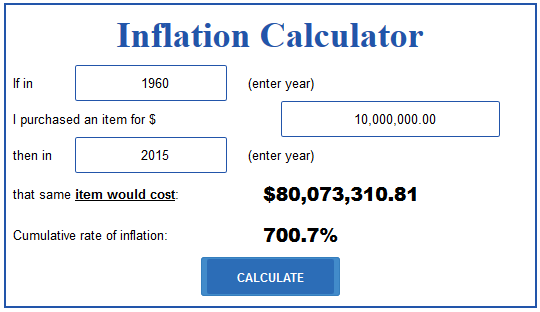

Even though a little different than our number, this is inflation adjusted. Having thought about it, in order to compare movies across decades, adjusted seems more relevant than original. For example, if revenue is really important to define a "good" movie, old movies would not even have a chance with original values since it is not being fairly compared. Granted, it's still not quite apples to apples given difference in technology, costs, the nation's population, and number of theaters assocaited with early film compared to now. But, hey, we'll see what this does for us.

I think we've covered a good foundation of understanding what we need and what we can pass on. Let's MacGyver this!

### Shed those columns!

In [7]:
df.insert(19, 'release_month', pd.DatetimeIndex(df['release_date']).month, True)
df.drop(['id', 'imdb_id', 'popularity', 'budget', 'revenue', 'homepage', 'tagline', 'overview', 'release_date'], axis=1, inplace=True)
df.head()

,original_title,cast,director,keywords,runtime,genres,production_companies,vote_count,vote_average,release_year,release_month,budget_adj,revenue_adj
0,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,monster|dna|tyrannosaurus rex|velociraptor|island,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,5562,6.5,2015,6,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,future|chase|post-apocalyptic|dystopia|australia,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,6185,7.1,2015,5,1.379999e+08,3.481613e+08
2,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,based on novel|revolution|dystopia|sequel|dyst...,119,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wago...,2480,6.3,2015,3,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,android|spaceship|jedi|space opera|3d,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,5292,7.5,2015,12,1.839999e+08,1.902723e+09
4,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,car race|speed|revenge|suspense|car,137,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights ...,2947,7.3,2015,4,1.747999e+08,1.385749e+09


In [8]:
# Let's check for duplicates!
print(sum(df.duplicated()))

1


In [9]:
# Sweet! Not bad...
df.drop_duplicates(inplace=True)
df.reset_index(drop=True, inplace=True)
print(sum(df.duplicated()))

0


*I won't address nulls at the moment since all quantitative data that I'm interested in is 100% (There may be zeros lurking, though, in place of nulls!)*

Before we adjust our **huge** numbers, **how many movies have revenue values as 0 or less than 1M?**

In [10]:
print('Zero Revenue Count: ', sum(df['revenue_adj'] == 0))
print('Between 0 and 1M  : ', sum((df['revenue_adj'] > 0) & (df['revenue_adj'] < 1000000)))
print('Less than 0?      : ', sum(df['revenue_adj'] < 0))

Zero Revenue Count:  6016
Between 0 and 1M  :  511
Less than 0?      :  0


Looks like quite a few zeros! **Do we have very small revenues (less than 1M)?** (At least there are no negative values!)

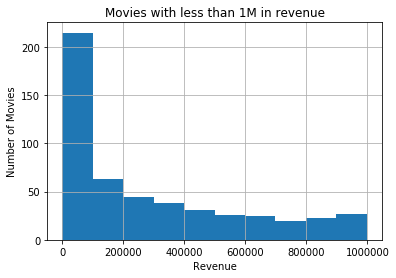

In [11]:
df[(df['revenue_adj'] > 0) & (df['revenue_adj'] < 1000000)]['revenue_adj'].hist()
plt.title("Movies with less than 1M in revenue")
plt.xlabel("Revenue")
plt.ylabel("Number of Movies")
plt.show()

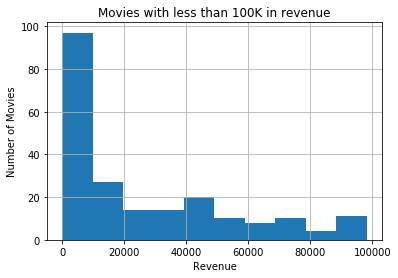

In [12]:
df[(df['revenue_adj'] > 0) & (df['revenue_adj'] < 100000)]['revenue_adj'].hist()
plt.title("Movies with less than 100K in revenue")
plt.xlabel("Revenue")
plt.ylabel("Number of Movies")
plt.show()

Let's take a look at the values, 100K, 10K, and 1000 in reveune respectively.

In [13]:
df[(df['revenue_adj'] > 0) & (df['revenue_adj'] < 100000)]['revenue_adj'].value_counts(bins=10)

(-95.766, 9815.932]       97
(9815.932, 19629.493]     27
(39256.615, 49070.175]    20
(29443.054, 39256.615]    14
(19629.493, 29443.054]    14
(88324.419, 98137.98]     11
(68697.297, 78510.858]    10
(49070.175, 58883.736]    10
(58883.736, 68697.297]     8
(78510.858, 88324.419]     4
Name: revenue_adj, dtype: int64

In [14]:
df[(df['revenue_adj'] > 0) & (df['revenue_adj'] < 10000)]['revenue_adj'].value_counts(bins=10)

(-6.849, 924.237]       51
(7377.298, 8299.164]    10
(5533.566, 6455.432]     8
(3689.834, 4611.7]       7
(8299.164, 9221.03]      5
(924.237, 1846.103]      5
(4611.7, 5533.566]       3
(2767.969, 3689.834]     3
(1846.103, 2767.969]     3
(6455.432, 7377.298]     2
Name: revenue_adj, dtype: int64

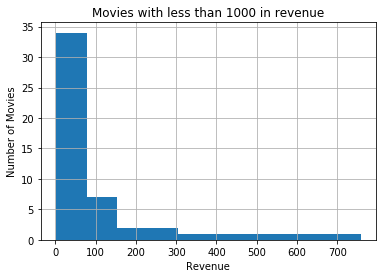

In [16]:
df[(df['revenue_adj'] > 0) & (df['revenue_adj'] < 1000)]['revenue_adj'].hist()
plt.title("Movies with less than 1000 in revenue")
plt.xlabel("Revenue")
plt.ylabel("Number of Movies")
plt.show()

**What does the budget look like versus the revenue at this level? Did the movie simply lose money or are these values junk?** (Keep in mind, as my example of "The Bellboy," budget can be zero with revenue being greater than zero due to the data being incomplete.)

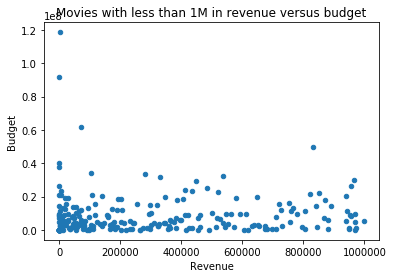

In [17]:
df[(df['budget_adj'] > 0) & (df['revenue_adj'] > 0) & (df['revenue_adj'] < 1000000)][['budget_adj', 'revenue_adj']].plot.scatter(x='revenue_adj',y='budget_adj')
plt.title("Movies with less than 1M in revenue versus budget")
plt.xlabel("Revenue")
plt.ylabel("Budget")
plt.show()

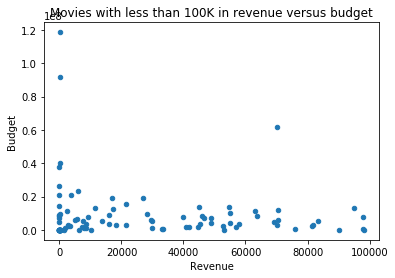

In [18]:
df[(df['budget_adj'] > 0) & (df['revenue_adj'] > 0) & (df['revenue_adj'] < 100000)][['budget_adj', 'revenue_adj']].plot.scatter(x='revenue_adj',y='budget_adj')
plt.title("Movies with less than 100K in revenue versus budget")
plt.xlabel("Revenue")
plt.ylabel("Budget")
plt.show()

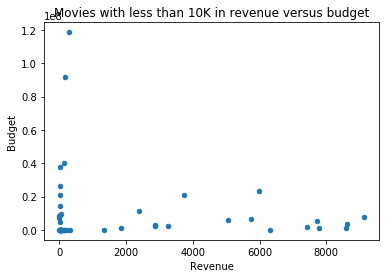

In [19]:
df[(df['budget_adj'] > 0) & (df['revenue_adj'] > 0) & (df['revenue_adj'] < 10000)][['budget_adj', 'revenue_adj']].plot.scatter(x='revenue_adj',y='budget_adj')
plt.title("Movies with less than 10K in revenue versus budget")
plt.xlabel("Revenue")
plt.ylabel("Budget")
plt.show()

Aside from the fact that budget versus revenue doesn't show the best relationship in this range, there may be movies that didn't pan out. Since it's highly questionable about these values, and the fact that there aren't many, perhaps it is best to filter these cases out. Since we're here, **what does the relationship look like for revenue greater than 1M?**

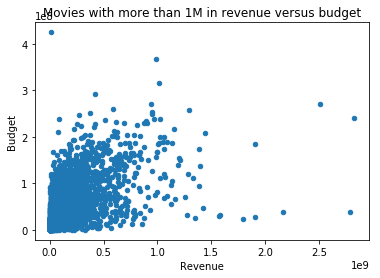

In [20]:
df[(df['budget_adj'] > 0) & (df['revenue_adj'] >= 1000000)][['budget_adj', 'revenue_adj']].plot.scatter(x='revenue_adj',y='budget_adj')
plt.title("Movies with more than 1M in revenue versus budget")
plt.xlabel("Revenue")
plt.ylabel("Budget")
plt.show()

Definitely all over the place! Before making any other decisions, let's see the mins and maxes here.

In [21]:
df[(df['budget_adj'] > 0) & (df['revenue_adj'] >= 1000000)][['budget_adj', 'revenue_adj']].describe()

,budget_adj,revenue_adj
count,3.610000e+03,3.610000e+03
mean,4.665504e+07,1.463087e+08
std,4.517116e+07,2.202536e+08
min,9.015402e+01,1.000000e+06
25%,1.524601e+07,2.416021e+07
50%,3.239475e+07,6.949089e+07
75%,6.329474e+07,1.749933e+08
max,4.250000e+08,2.827124e+09


90 dollars? For an inflation-adjusted budget? If all things were perfect, we could use budget and revenue as a ratio to determine how well this movie succeeded. However, it's looking like some data is probably not correct at all. Perhaps, to make a judgment call, we need to cut off budget like we will for revenue at 1M and call it a day to at least see something interesting for this ratio idea.

In [22]:
print('How many movies are left?: ', sum((df['budget_adj'] > 1000000) & (df['revenue_adj'] >= 1000000)))

How many movies are left?:  3548


Holy Erroneous Data, Batman! Only roughly 35% data left to play with, at least with this venture. For now, let's hold this thought and see how the ratings pan out. What level of Temple of Doom will we run into here?

In [23]:
df['vote_count'].describe()

count    10865.000000
mean       217.399632
std        575.644627
min         10.000000
25%         17.000000
50%         38.000000
75%        146.000000
max       9767.000000
Name: vote_count, dtype: float64

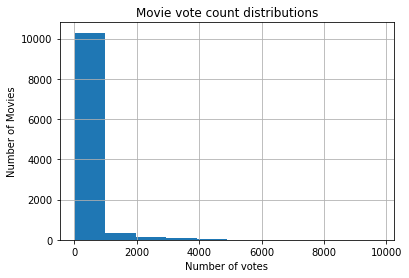

In [25]:
df['vote_count'].hist()
plt.title("Movie vote count distributions")
plt.xlabel("Number of votes")
plt.ylabel("Number of Movies")
plt.show()

In [26]:
df[df['vote_count'] < 1000]['vote_count'].value_counts(bins=10)

(9.01, 108.9]     7678
(108.9, 207.8]    1047
(207.8, 306.7]     497
(306.7, 405.6]     321
(405.6, 504.5]     228
(504.5, 603.4]     158
(603.4, 702.3]     117
(702.3, 801.2]     110
(801.2, 900.1]      79
(900.1, 999.0]      66
Name: vote_count, dtype: int64

In [27]:
df[df['vote_count'] < 100]['vote_count'].value_counts(bins=10)

(9.91, 18.9]    3141
(18.9, 27.8]    1363
(27.8, 36.7]     811
(36.7, 45.6]     569
(45.6, 54.5]     454
(54.5, 63.4]     334
(72.3, 81.2]     255
(63.4, 72.3]     251
(81.2, 90.1]     198
(90.1, 99.0]     161
Name: vote_count, dtype: int64

A good chunk of movies seem to have at least 30 votes! **What is their average relative to the rest of the group - how skewed are they?**

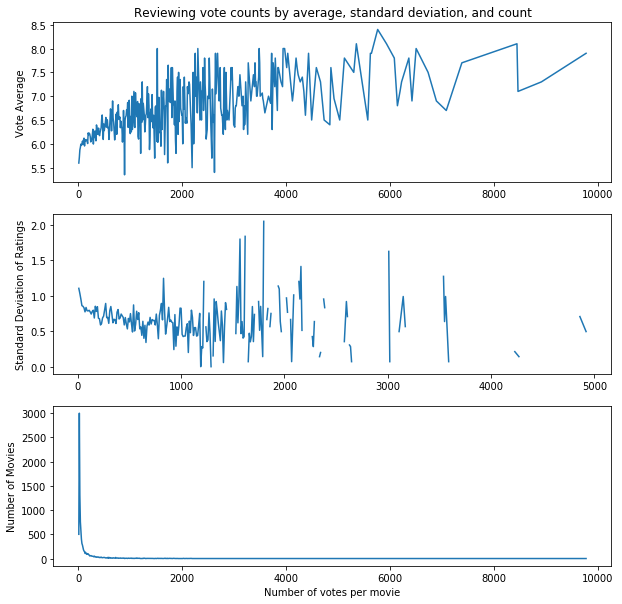

In [42]:
std_of_ratings = {}
average_ratings = {}
vote_counts = {}
for i in range(10,10001,10):
    if df[(df['vote_count'] > i - 10) & (df['vote_count'] <= i)]['vote_count'].count() == 0:
        i += 10
    else:
        std_of_ratings[i] = df[(df['vote_count'] > i - 10) & (df['vote_count'] <= i)]['vote_average'].std()
        average_ratings[i] = df[(df['vote_count'] > i - 10) & (df['vote_count'] <= i)]['vote_average'].mean()
        vote_counts[i] = df[(df['vote_count'] > i - 10) & (df['vote_count'] <= i)]['vote_count'].count()

x=list(average_ratings.keys())
y1=list(average_ratings.values())
y2=list(std_of_ratings.values())
y3=list(vote_counts.values())
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
plt.plot(x, y1)
plt.ylabel("Vote Average")
plt.title("Reviewing vote counts by average, standard deviation, and count")
plt.subplot(3,1,2)
plt.plot(x, y2)
plt.ylabel("Standard Deviation of Ratings")
plt.subplot(3,1,3)
plt.plot(x, y3)
plt.ylabel("Number of Movies")
plt.xlabel("Number of votes per movie")
plt.show()

In [30]:
df['vote_count'].value_counts(sort=False,bins=10)

(0.242, 985.7]      10291
(985.7, 1961.4]       338
(1961.4, 2937.1]      119
(2937.1, 3912.8]       65
(3912.8, 4888.5]       26
(4888.5, 5864.2]       10
(5864.2, 6839.9]        9
(6839.9, 7815.6]        3
(7815.6, 8791.3]        2
(8791.3, 9767.0]        2
Name: vote_count, dtype: int64

Looks like we need to consider a couple of things:

1. At most, about 3000 movies have very few votes, which averaging all of these averages of votes yeilds a rather low average. Checking the standard deviation seems to show how widespread these few voted ratings give. (As the standard deviation moves toward fewer and fewer data points, the standard deviation plot becomes noisy and meaningless.)

2. Most movies have up to 1000 votes. From here, very few movies have a large amount of votes. The plus side for those few is their vote average is relatively stable from so many viewers casting their opinion of the movie.

Looking very closely at the beginning of the standard deviation graph, we could cut off our movies with up to a certain number of votes since the plot seems to have a more stable variation until we pass 1000 votes. Let's see where we draw that line.

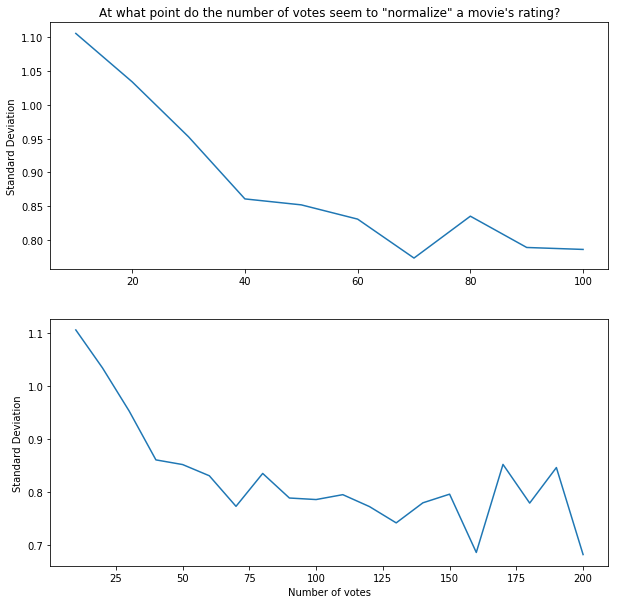

In [44]:
plt.figure(figsize=(10,10))
plt.subplot(2,1,1)
plt.plot(x[:10], y2[:10])
plt.ylabel("Standard Deviation")
plt.title("At what point do the number of votes seem to \"normalize\" a movie's rating?")
plt.subplot(2,1,2)
plt.plot(x[:20], y2[:20])
plt.xlabel("Number of votes")
plt.ylabel("Standard Deviation")
plt.show()

Looks like at least 40 starts a reasonable variation. How many movies are left?

In [35]:
print(sum(df['vote_count'] >= 40))

5344


"Not great, not terrible."

## Quick recap!

**If I want to examine something to say this is a "good" movie, can I look at revenue? Can I look at revenue vs. budget to see what the ROI is? What about viewer ratings?**

>So far:
- Revenue as it stands has a very wide range of values as low as 0 dollars. Reducing this to a 1M-dollar cut-off puts us at about 3600 movies; with a limit of 1M for budget as well, we have about 3500 movies.
- Ratings are fairly usable with only about half the movie list lost.

*So, what's next?* Well, if we think for a second, it would be nice to see what the top most-grossed movies were. Or we could see what the most rated or highest rated films were. *But what about within categories? The best sci-fi? The most screened actor/actress? More importantly, is there some parallel analysis going on here to suggest part of why our top movies are at the top: Big budget; strong cast; popular genre; awesome time of the year; etc.?* This is something to start with to get to a more granular analysis. So, let's unshelve those other columns and see what we get before getting to a final stage of analysis.

### Genres

In [36]:
df['genres'].head()

0    Action|Adventure|Science Fiction|Thriller
1    Action|Adventure|Science Fiction|Thriller
2           Adventure|Science Fiction|Thriller
3     Action|Adventure|Science Fiction|Fantasy
4                        Action|Crime|Thriller
Name: genres, dtype: object

In [37]:
df['genres'].nunique()

2039

In [38]:
print("Number of null values: ", sum(df['genres'].isnull()))

Number of null values:  23


Hmm... So over 2000 combinations of genres. And it appears the number of genres listed vary, but may be at most five. Let's check this. (Thankfully not many nulls!)

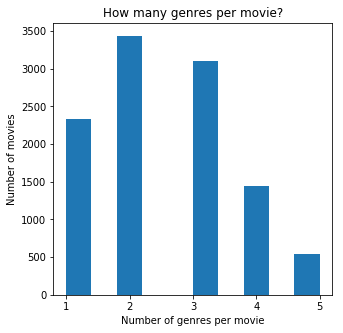

In [41]:
genre_count = []
for i in range(0,len(df)):
    if pd.isnull(df['genres'][i]) == True:
        i += 1
    else:
        genre_count.append(df['genres'][i].count('|'))

plt.figure(figsize=(5,5))
plt.hist(genre_count)
plt.xticks([0,1,2,3,4],[1,2,3,4,5])
plt.xlabel("Number of genres per movie")
plt.ylabel("Number of movies")
plt.title("How many genres per movie?")
plt.show()

It looks like the majority of movies have less than 4 genres associated with them. It would be nice to know what unique genres we have. Let's make a specific list.

In [45]:
genre_list = []
for i in range(0,len(df)):
    if pd.isnull(df['genres'][i]) == True:
        i += 1
    else:
        genre_list.append(df['genres'][i].split('|'))

genre_list = [genre for lst in genre_list for genre in lst]
unique_genre_list = sorted(list(set(genre_list)))
print(unique_genre_list)
print(len(unique_genre_list))

['Action', 'Adventure', 'Animation', 'Comedy', 'Crime', 'Documentary', 'Drama', 'Family', 'Fantasy', 'Foreign', 'History', 'Horror', 'Music', 'Mystery', 'Romance', 'Science Fiction', 'TV Movie', 'Thriller', 'War', 'Western']
20


20 different genres. And it looks clean - no misspellings, weird characters or variants of the same thing! Let's take a look at the number of times these genres appear.

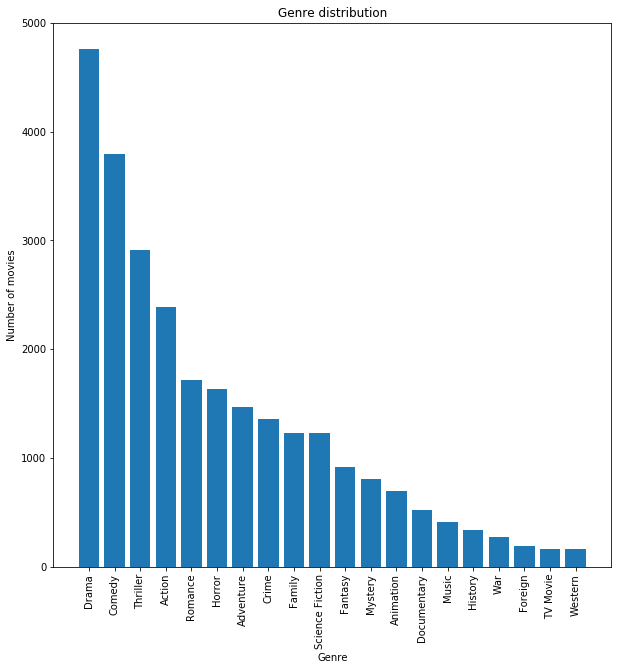

In [46]:
genre_dict = {}
for i in range(0,len(unique_genre_list)):
    genre_dict[unique_genre_list[i]] = genre_list.count(unique_genre_list[i])
    
sorted_genre_dict = dict(sorted(genre_dict.items() , reverse=True, key=lambda x: x[1]))

plt.figure(figsize=(10,10))
x=list(sorted_genre_dict.keys())
y=list(sorted_genre_dict.values())
plt.bar(range(len(x)), y, tick_label=x)
plt.xticks(rotation=90)
plt.xlabel("Genre")
plt.ylabel("Number of movies")
plt.title("Genre distribution")
plt.show()

Interesting. Drama, Comedy, Thriller, and Action, in particular, seem mosted used whether paired with other genres or not. Perhaps this is something useful for later if we want to keep things very simple. (An interesting question: *Can using these first few genres capture most, if not all, movies? What genres are left over that weren't covered?*)

While we're at it, let's look at the cast list. (Should be a big list!)

### Cast

In [47]:
df['cast'].head()

0    Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...
1    Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...
2    Shailene Woodley|Theo James|Kate Winslet|Ansel...
3    Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...
4    Vin Diesel|Paul Walker|Jason Statham|Michelle ...
Name: cast, dtype: object

In [48]:
print(df['cast'][0])

Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vincent D'Onofrio|Nick Robinson


In [49]:
print("Number of null values: ", sum(df['cast'].isnull()))

Number of null values:  76


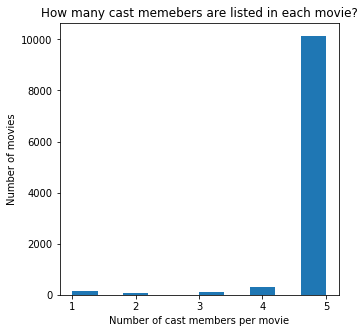

In [51]:
cast_count = []
for i in range(0,len(df)):
    if pd.isnull(df['cast'][i]) == True:
        i += 1
    else:
        cast_count.append(df['cast'][i].count('|'))

plt.figure(figsize=(5,5))
plt.hist(cast_count)
plt.xticks([0,1,2,3,4],[1,2,3,4,5])
plt.xlabel("Number of cast members per movie")
plt.ylabel("Number of movies")
plt.title("How many cast memebers are listed in each movie?")
plt.show()

In [52]:
cast_list = []
for i in range(0,len(df)):
    if pd.isnull(df['cast'][i]) == True:
        i += 1
    else:
        cast_list.append(df['cast'][i].split('|'))

cast_list = [cast.strip() for lst in cast_list for cast in lst]
cast_list = sorted(list(set(cast_list)))
print(cast_list[:10])
print(len(cast_list))

['"Weird Al" Yankovic', '50 Cent', 'A Martinez', 'A. J. Langer', 'A. Michael Baldwin', 'A.J. Buckley', 'A.J. Cook', 'AJ Bowen', 'AJ Michalka', 'Aaliyah']
19026


"What did you do, Ray?" Oh my! Well...yes, I guess this would be where the train quickly stops. Trying to wrangle - nevermind clean - over 19000 names is probably not the best use of our time. However, a [general websearch](https://en.wikipedia.org/wiki/Billing_(performing_arts)) says that the first actors/actresss in the credits are "principal characters in the film and have the most screen time." Having said that, let's see if only selecting the first person from each of these will yeild any value.

In [53]:
cast_list = []
for i in range(0,len(df)):
    if pd.isnull(df['cast'][i]) == True:
        i += 1
    else:
        cast_list.append(df['cast'][i].split('|'))

top_cast_list = []
for i in range(0,len(cast_list)):
    top_cast_list.append(cast_list[i][0].strip())

unique_top_cast_list = sorted(list(set(top_cast_list)))
print(unique_top_cast_list[:10])
print(len(unique_top_cast_list))

['"Weird Al" Yankovic', '50 Cent', 'A. Michael Baldwin', 'A.J. Cook', 'AJ Michalka', 'Aamir Khan', 'Aarif Lee', 'Aaron Abrams', 'Aaron Ashmore', 'Aaron Eckhart']
4300


Not bad. How often do these folks come up?

In [54]:
cast_df = []
for i in range(0,len(unique_top_cast_list)):
    cast_df.append([unique_top_cast_list[i], top_cast_list.count(unique_top_cast_list[i])])
    
cast_df = pd.DataFrame(cast_df, columns=["Name","Count"])
cast_df.sort_values(by='Count', inplace=True, ascending=False)
cast_df.reset_index(drop=True, inplace=True);

In [55]:
cast_df['Count'].value_counts()

1     2765
2      610
3      257
4      160
5       98
6       79
7       56
8       43
9       33
10      29
11      23
13      20
12      17
14      13
15      11
16      10
17      10
18       9
24       7
29       7
20       5
21       5
19       4
30       4
25       4
33       3
37       3
35       2
23       2
28       2
22       2
26       2
31       1
38       1
42       1
50       1
39       1
Name: Count, dtype: int64

In [56]:
cast_df[cast_df['Count'] >= 20]

,Name,Count
0,Nicolas Cage,50
1,Robert De Niro,42
2,Bruce Willis,39
3,Clint Eastwood,38
4,Johnny Depp,37
5,Sylvester Stallone,37
6,Tom Hanks,37
7,Steven Seagal,35
8,Jean-Claude Van Damme,35
9,Robin Williams,33


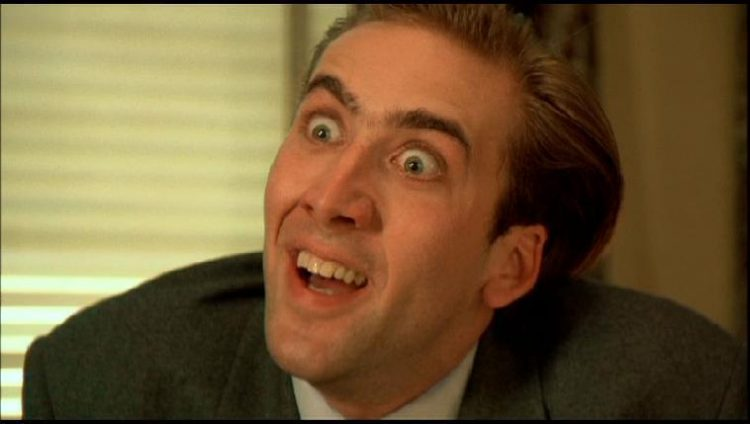

Many have made only a few appearances, at least being the top-listed actor/actress per movie. This seems like a decent way to narrow this column down. It would be good to check to make sure the director column also has one value to make this manageable.

### Directors

In [57]:
print("Number of null values: ", sum(df['director'].isnull()))

Number of null values:  44


In [58]:
count = 0
for i in range(0,len(df)):
    if pd.isnull(df['director'][i]) == True:
        i += 1
    else:
        if ('|' in df['director'][i]) == True:
            count += 1
        else:
            count += 0
        
print(count)

754


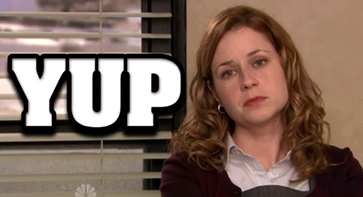

Doh! Well, let's single these out like the cast. More importantly, what do these look like?

In [59]:
multi_director_df = []
for i in range(0,len(df)):
    if pd.isnull(df['director'][i]) == True:
        i += 1
    else:
        if ('|' in df['director'][i]) == True:
            multi_director_df.append([df['director'][i], df['director'][i].count('|'), i])
               
multi_director_df = pd.DataFrame(multi_director_df, columns=["Names","Pipe Count", "Index"])
multi_director_df.sort_values(by='Pipe Count', inplace=True, ascending=False)
multi_director_df.reset_index(drop=True, inplace=True);

In [60]:
multi_director_df[multi_director_df['Pipe Count'] > 0]

,Names,Pipe Count,Index
0,Theo Angelopoulos|Olivier Assayas|Bille August...,35,7750
1,Chris Nash|Rodney Ascher|Bill Plympton|Erik Ma...,29,919
2,Angela Bettis|HÃ©lÃ¨ne Cattet|Ernesto DÃ­az Es...,26,5768
3,Steven Brill|Elizabeth Banks|Steve Carr|Rusty ...,11,5534
4,Darren Lynn Bousman|Axelle Carolyn|Adam Gieras...,10,310
5,Natalie Portman|Fatih Akin|Mira Nair|Allen Hug...,10,1458
6,Antonio Padovan|Bryan Norton|Marc Roussel|Ryan...,9,620
7,Matt Bettinelli-Olpin|David Bruckner|Tyler Gil...,9,4557
8,Breck Eisner|FÃ©lix EnrÃ­quez AlcalÃ¡|John Faw...,8,4040
9,Paul Brizzi|Hendel Butoy|Francis Glebas|Eric G...,7,2476


In [61]:
df['director'][7750]

'Theo Angelopoulos|Olivier Assayas|Bille August|Jane Campion|Youssef Chahine|Chen Kaige|Michael Cimino|Ethan Coen|Joel Coen|David Cronenberg|Jean-Pierre Dardenne|Luc Dardenne|Manoel de Oliveira|Raymond Depardon|Atom Egoyan|Amos Gitai|Alejandro GonzÃ¡lez IÃ±Ã¡rritu|Hou Hsiao-Hsien|Aki KaurismÃ¤ki|Abbas Kiarostami|Takeshi Kitano|Andrei Konchalovsky|Claude Lelouch|Ken Loach|David Lynch|Nanni Moretti|Roman Polanski|RaÃºl Ruiz|Walter Salles|Elia Suleiman|Tsai Ming-Liang|Gus Van Sant|Lars von Trier|Wim Wenders|Wong Kar-wai|Zhang Yimou'

...............Wow. I mean, what does this even mean? 36 directors sounds insane. So, what is this, then?

In [62]:
df['original_title'][7750]

"Chacun son cinema ou Ce petit coup au coeur quand la lumiere s'eteint et que le film commence"

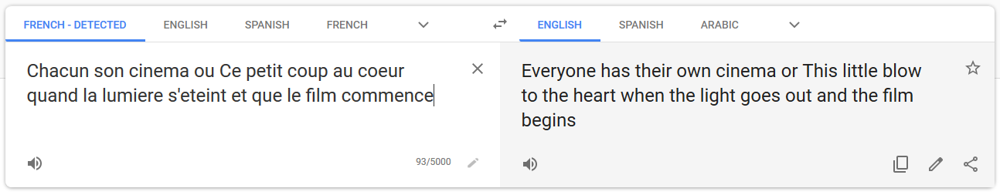

Is this a movie or some mistake in the data?

In [63]:
df.loc[[7750]]

,original_title,cast,director,keywords,runtime,genres,production_companies,vote_count,vote_average,release_year,release_month,budget_adj,revenue_adj
7750,Chacun son cinema ou Ce petit coup au coeur qu...,Isabelle Adjani|Pegah Ahangarani|Anouk AimÃ©e|...,Theo Angelopoulos|Olivier Assayas|Bille August...,woman director,100,Comedy|Drama,ElzÃ©vir Films|Cannes Film Festival,10,7.4,2007,5,0.0,0.0


It's definitely a movie, just very unusual on how this data was collected for this film. Now, this film would filter out if we look at limits on budget and revenue since this shows 0, which is probably something to do with foreign currency and this dataset is largely U.S. currency based. This might be where this dataset should have the production_country in here to help navigate problems with the data itself. If currency values are worldwide in this dataset, that's fine and can be converted to address homogeneity provided all foreign films have values more than zero. However, if we want to sift through our data and only look at a certain country's films at a time, this dataset will not be able to accompany that very easily.

Let's recall that the aim to look at quantitative data by itself is to see what we can capture from it and use it in parallel with something else. I think as a judgment call, I should treat the director column the same as cast and pick the first person, even though that may have a different meaning than "top-billed." Doing a general search doesn't produce much on the ordering, but let's assume the first is the most important.

In [64]:
director_list = []
for i in range(0,len(df)):
    if pd.isnull(df['director'][i]) == True:
        i += 1
    else:
        director_list.append(df['director'][i].split('|'))

top_director_list = []
for i in range(0,len(director_list)):
    top_director_list.append(director_list[i][0].strip())

unique_top_director_list = sorted(list(set(top_director_list)))
print(unique_top_director_list[:10])
print(len(unique_top_director_list))

['A. Todd Smith', 'A.R. Murugadoss', 'Aaron Aites', 'Aaron Blaise', 'Aaron Hann', 'Aaron Harvey', 'Aaron Katz', 'Aaron Keeling', 'Aaron Moorhead', 'Aaron Norris']
4837


In [65]:
director_df = []
for i in range(0,len(unique_top_director_list)):
    director_df.append([unique_top_director_list[i], top_director_list.count(unique_top_director_list[i])])
    
director_df = pd.DataFrame(director_df, columns=["Name","Count"])
director_df.sort_values(by='Count', inplace=True, ascending=False)
director_df.reset_index(drop=True, inplace=True);

In [66]:
director_df['Count'].value_counts()

1     2922
2      795
3      372
4      210
5      148
6      100
7       70
8       60
10      35
9       34
11      23
17      12
12      11
13       9
14       7
16       7
15       5
18       4
19       3
20       2
22       2
46       1
21       1
34       1
29       1
30       1
23       1
Name: Count, dtype: int64

In [67]:
director_df[director_df['Count'] >= 10]

,Name,Count
0,Woody Allen,46
1,Clint Eastwood,34
2,Martin Scorsese,30
3,Steven Spielberg,29
4,Ridley Scott,23
5,Steven Soderbergh,22
6,Ron Howard,22
7,Joel Schumacher,21
8,Tim Burton,20
9,Brian De Palma,20


No sign of *imposters* here. This will have to do. 

I think it's fair to say that production_companies should also be trimmed to one name.

### Production Companies

In [68]:
production_list = []
for i in range(0,len(df)):
    if pd.isnull(df['production_companies'][i]) == True:
        i += 1
    else:
        production_list.append(df['production_companies'][i].split('|'))

top_production_list = []
for i in range(0,len(production_list)):
    top_production_list.append(production_list[i][0].strip())

unique_top_production_list = sorted(list(set(top_production_list)))
print(unique_top_production_list[:10])
print(len(unique_top_production_list))

['10th Hole Productions', '120dB Films', '1492 Pictures', '1818', '185 Trax', '2 Entertain Video', '2 Player Productions', '2.4.7. Films', '2003 Productions', '20ten Media']
3057


In [69]:
production_df = []
for i in range(0,len(unique_top_production_list)):
    production_df.append([unique_top_production_list[i], top_production_list.count(unique_top_production_list[i])])
    
production_df = pd.DataFrame(production_df, columns=["Name","Count"])
production_df.sort_values(by='Count', inplace=True, ascending=False)
production_df.reset_index(drop=True, inplace=True);

In [70]:
production_df['Count'].value_counts()

1      2059
2       437
3       184
4       100
5        47
7        41
6        36
10       18
9        18
8        17
11       13
14       10
21        5
12        5
13        4
15        4
19        4
18        4
22        3
27        3
16        2
17        2
29        2
20        2
35        2
73        2
46        2
44        1
68        1
52        1
24        1
36        1
34        1
30        1
72        1
70        1
271       1
88        1
31        1
119       1
79        1
69        1
45        1
41        1
39        1
37        1
33        1
25        1
104       1
23        1
460       1
121       1
242       1
214       1
206       1
172       1
132       1
426       1
Name: Count, dtype: int64

In [71]:
production_df[production_df['Count'] >= 100]

,Name,Count
0,Universal Pictures,460
1,Paramount Pictures,426
2,Columbia Pictures,271
3,Twentieth Century Fox Film Corporation,242
4,Walt Disney Pictures,214
5,New Line Cinema,206
6,Warner Bros.,172
7,Miramax Films,132
8,TriStar Pictures,121
9,Columbia Pictures Corporation,119


Columbia is here twice... It might be valid, but I'm tempted to think not. Let's move on, shall we?

...Remember keywords?

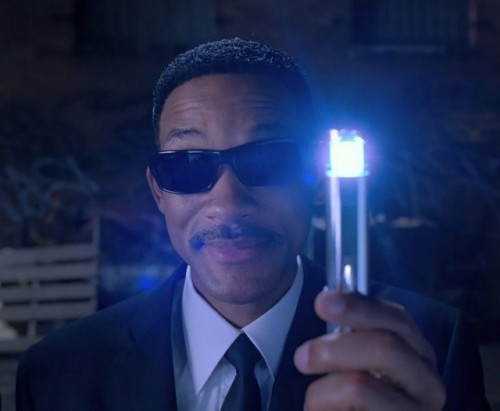

In [72]:
df.drop(['keywords'], axis=1, inplace=True)

Okay, it's time to get the band together! We're on a mission!

### Data Cleaning

All right. So, we've covered some territory and understood what we have to work with. Let's shape this and see how this all pans out!

>To-Do:
- Shore up pipe-delimited columns with only one name (genre as an exception)
- Divide monetary columns by 1M
- Create some dataframes

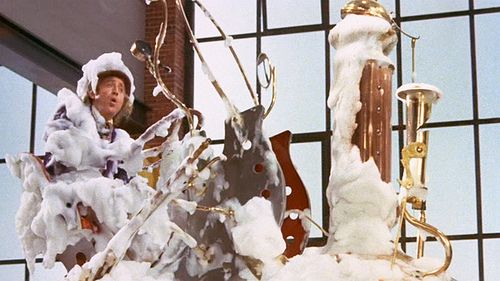

In [73]:
df.head()

,original_title,cast,director,runtime,genres,production_companies,vote_count,vote_average,release_year,release_month,budget_adj,revenue_adj
0,Jurassic World,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,Universal Studios|Amblin Entertainment|Legenda...,5562,6.5,2015,6,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures|Kennedy Miller Produ...,6185,7.1,2015,5,1.379999e+08,3.481613e+08
2,Insurgent,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,119,Adventure|Science Fiction|Thriller,Summit Entertainment|Mandeville Films|Red Wago...,2480,6.3,2015,3,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm|Truenorth Productions|Bad Robot,5292,7.5,2015,12,1.839999e+08,1.902723e+09
4,Furious 7,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,137,Action|Crime|Thriller,Universal Pictures|Original Film|Media Rights ...,2947,7.3,2015,4,1.747999e+08,1.385749e+09


### Shave off the extras: Single names in cast, director, and production_company

In [74]:
top_billed = []
sole_director = []
production_company = []
for i in range(0,len(df)):
    if pd.isnull(df['cast'][i]) == True:
        top_billed.append('Not listed')
    else:
        top_billed.append(df['cast'][i].split('|'))
        
    if pd.isnull(df['director'][i]) == True:
        sole_director.append('Not listed')
    else:
        sole_director.append(df['director'][i].split('|'))
        
    if pd.isnull(df['production_companies'][i]) == True:
        production_company.append('Not listed')
    else:
        production_company.append(df['production_companies'][i].split('|')) 

In [75]:
final_top_billed = []
for i in range(0,len(df)):
    final_top_billed.append(top_billed[i][0].strip())
    
final_director = []
for i in range(0,len(df)):
    final_director.append(sole_director[i][0].strip())
    
final_production = []
for i in range(0,len(df)):
    final_production.append(production_company[i][0].strip())

In [76]:
df.insert(1, 'top_billed', pd.DataFrame(final_top_billed))
df.insert(3, 'sole_director', pd.DataFrame(final_director))
df.insert(7, 'production_company', pd.DataFrame(final_production))
df.head()

,original_title,top_billed,cast,sole_director,director,runtime,genres,production_company,production_companies,vote_count,vote_average,release_year,release_month,budget_adj,revenue_adj
0,Jurassic World,Chris Pratt,Chris Pratt|Bryce Dallas Howard|Irrfan Khan|Vi...,Colin Trevorrow,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,Universal Studios,Universal Studios|Amblin Entertainment|Legenda...,5562,6.5,2015,6,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,Tom Hardy,Tom Hardy|Charlize Theron|Hugh Keays-Byrne|Nic...,George Miller,George Miller,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures,Village Roadshow Pictures|Kennedy Miller Produ...,6185,7.1,2015,5,1.379999e+08,3.481613e+08
2,Insurgent,Shailene Woodley,Shailene Woodley|Theo James|Kate Winslet|Ansel...,Robert Schwentke,Robert Schwentke,119,Adventure|Science Fiction|Thriller,Summit Entertainment,Summit Entertainment|Mandeville Films|Red Wago...,2480,6.3,2015,3,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,Harrison Ford,Harrison Ford|Mark Hamill|Carrie Fisher|Adam D...,J.J. Abrams,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm,Lucasfilm|Truenorth Productions|Bad Robot,5292,7.5,2015,12,1.839999e+08,1.902723e+09
4,Furious 7,Vin Diesel,Vin Diesel|Paul Walker|Jason Statham|Michelle ...,James Wan,James Wan,137,Action|Crime|Thriller,Universal Pictures,Universal Pictures|Original Film|Media Rights ...,2947,7.3,2015,4,1.747999e+08,1.385749e+09


Sweet! Let's drop the old columns and continue!

In [77]:
df.drop(['cast','director','production_companies'], axis=1, inplace=True)
df.head()

,original_title,top_billed,sole_director,runtime,genres,production_company,vote_count,vote_average,release_year,release_month,budget_adj,revenue_adj
0,Jurassic World,Chris Pratt,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,Universal Studios,5562,6.5,2015,6,1.379999e+08,1.392446e+09
1,Mad Max: Fury Road,Tom Hardy,George Miller,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures,6185,7.1,2015,5,1.379999e+08,3.481613e+08
2,Insurgent,Shailene Woodley,Robert Schwentke,119,Adventure|Science Fiction|Thriller,Summit Entertainment,2480,6.3,2015,3,1.012000e+08,2.716190e+08
3,Star Wars: The Force Awakens,Harrison Ford,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm,5292,7.5,2015,12,1.839999e+08,1.902723e+09
4,Furious 7,Vin Diesel,James Wan,137,Action|Crime|Thriller,Universal Pictures,2947,7.3,2015,4,1.747999e+08,1.385749e+09


### Budget and revenue: Shorten values for easy reading

In [78]:
budget_M = []
revenue_M = []
for i in range(0,len(df)):
    if (df['budget_adj'][i] >= 1000000) & (df['revenue_adj'][i] >= 1000000):
        budget_M.append(df['budget_adj'][i]/1000000)
        revenue_M.append(df['revenue_adj'][i]/1000000)      
    else:
        budget_M.append(np.nan)
        revenue_M.append(np.nan)
        
df['budget_M'] = pd.DataFrame(budget_M)
df['revenue_M'] = pd.DataFrame(revenue_M)

df[['budget_adj','budget_M','revenue_adj','revenue_M']].describe()

,budget_adj,budget_M,revenue_adj,revenue_M
count,1.086500e+04,3549.000000,1.086500e+04,3549.000000
mean,1.754989e+07,47.449143,5.136900e+07,148.292168
std,3.430753e+07,45.146233,1.446383e+08,221.484072
min,0.000000e+00,1.000000,0.000000e+00,1.000000
25%,0.000000e+00,16.182227,0.000000e+00,25.116370
50%,0.000000e+00,32.839680,0.000000e+00,71.262150
75%,2.085325e+07,64.393509,3.370173e+07,176.533387
max,4.250000e+08,425.000000,2.827124e+09,2827.123750


In [79]:
df.drop(['budget_adj','revenue_adj'], axis=1, inplace=True)
df.head()

,original_title,top_billed,sole_director,runtime,genres,production_company,vote_count,vote_average,release_year,release_month,budget_M,revenue_M
0,Jurassic World,Chris Pratt,Colin Trevorrow,124,Action|Adventure|Science Fiction|Thriller,Universal Studios,5562,6.5,2015,6,137.999939,1392.445893
1,Mad Max: Fury Road,Tom Hardy,George Miller,120,Action|Adventure|Science Fiction|Thriller,Village Roadshow Pictures,6185,7.1,2015,5,137.999939,348.161292
2,Insurgent,Shailene Woodley,Robert Schwentke,119,Adventure|Science Fiction|Thriller,Summit Entertainment,2480,6.3,2015,3,101.199955,271.619025
3,Star Wars: The Force Awakens,Harrison Ford,J.J. Abrams,136,Action|Adventure|Science Fiction|Fantasy,Lucasfilm,5292,7.5,2015,12,183.999919,1902.723130
4,Furious 7,Vin Diesel,James Wan,137,Action|Crime|Thriller,Universal Pictures,2947,7.3,2015,4,174.799923,1385.748801


Now let's create that ratio and see if that is meaningful to us or not.

### Revenue divided by budget

In [80]:
ROI = []
for i in range(0,len(df)):
    ROI.append(df['revenue_M'][i]/df['budget_M'][i])
    
df['ROI'] = pd.DataFrame(ROI)

df[['budget_M','revenue_M','ROI']].describe()

,budget_M,revenue_M,ROI
count,3549.000000,3549.000000,3549.000000
mean,47.449143,148.292168,4.277660
std,45.146233,221.484072,9.751600
min,1.000000,1.000000,0.017098
25%,16.182227,25.116370,1.025812
50%,32.839680,71.262150,2.219763
75%,64.393509,176.533387,4.218249
max,425.000000,2827.123750,250.000000


In [81]:
df['ROI'].value_counts(bins=10)

(-0.234, 25.015]      3482
(25.015, 50.014]        38
(50.014, 75.012]        18
(75.012, 100.01]         5
(100.01, 125.009]        3
(225.002, 250.0]         2
(125.009, 150.007]       1
(200.003, 225.002]       0
(175.005, 200.003]       0
(150.007, 175.005]       0
Name: ROI, dtype: int64

Looks promising, even though there are a few ratios rather high. We'll see what this produces later.

Before moving on, it would be good to merge some data from the cast, director, and company counts. This might be interesting somewhere along the way.

### Bring in some counts

In [82]:
df = df[['original_title','top_billed','sole_director','production_company','genres','runtime','release_year','release_month','vote_count','vote_average','budget_M','revenue_M','ROI']]
df.head()

,original_title,top_billed,sole_director,production_company,genres,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI
0,Jurassic World,Chris Pratt,Colin Trevorrow,Universal Studios,Action|Adventure|Science Fiction|Thriller,124,2015,6,5562,6.5,137.999939,1392.445893,10.090192
1,Mad Max: Fury Road,Tom Hardy,George Miller,Village Roadshow Pictures,Action|Adventure|Science Fiction|Thriller,120,2015,5,6185,7.1,137.999939,348.161292,2.522909
2,Insurgent,Shailene Woodley,Robert Schwentke,Summit Entertainment,Adventure|Science Fiction|Thriller,119,2015,3,2480,6.3,101.199955,271.619025,2.683984
3,Star Wars: The Force Awakens,Harrison Ford,J.J. Abrams,Lucasfilm,Action|Adventure|Science Fiction|Fantasy,136,2015,12,5292,7.5,183.999919,1902.723130,10.340891
4,Furious 7,Vin Diesel,James Wan,Universal Pictures,Action|Crime|Thriller,137,2015,4,2947,7.3,174.799923,1385.748801,7.927628


In [83]:
temp1 = pd.merge(df, cast_df, left_on='top_billed', right_on='Name')
temp1.drop(['Name'], axis=1, inplace=True)
temp1.rename(columns={'Count': 'top_billed_movie_count'}, inplace=True)
temp1.head()

,original_title,top_billed,sole_director,production_company,genres,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count
0,Jurassic World,Chris Pratt,Colin Trevorrow,Universal Studios,Action|Adventure|Science Fiction|Thriller,124,2015,6,5562,6.5,137.999939,1392.445893,10.090192,2
1,Guardians of the Galaxy,Chris Pratt,James Gunn,Marvel Studios,Action|Science Fiction|Adventure,121,2014,7,5612,7.9,156.585479,712.291130,4.548896,2
2,Mad Max: Fury Road,Tom Hardy,George Miller,Village Roadshow Pictures,Action|Adventure|Science Fiction|Thriller,120,2015,5,6185,7.1,137.999939,348.161292,2.522909,10
3,Legend,Tom Hardy,Brian Helgeland,Working Title Films,Crime|Thriller,131,2015,9,619,6.7,22.999990,39.535137,1.718920,10
4,Child 44,Tom Hardy,Daniel Espinosa,Summit Entertainment,Crime|Thriller,137,2015,3,341,5.9,45.999980,3.058382,0.066487,10


In [84]:
temp2 = pd.merge(temp1, director_df, left_on='sole_director', right_on='Name')
temp2.drop(['Name'], axis=1, inplace=True)
temp2.rename(columns={'Count': 'director_movie_count'}, inplace=True)
temp2.head()

,original_title,top_billed,sole_director,production_company,genres,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count
0,Jurassic World,Chris Pratt,Colin Trevorrow,Universal Studios,Action|Adventure|Science Fiction|Thriller,124,2015,6,5562,6.5,137.999939,1392.445893,10.090192,2,2
1,Safety Not Guaranteed,Aubrey Plaza,Colin Trevorrow,Duplass Brothers Productions,Comedy|Romance|Science Fiction|Drama,85,2012,6,341,6.7,NaN,NaN,NaN,4,2
2,Guardians of the Galaxy,Chris Pratt,James Gunn,Marvel Studios,Action|Science Fiction|Adventure,121,2014,7,5612,7.9,156.585479,712.291130,4.548896,2,3
3,Super,Rainn Wilson,James Gunn,This Is That Productions,Comedy|Action|Drama,96,2010,9,211,6.6,NaN,NaN,NaN,2,3
4,Slither,Nathan Fillion,James Gunn,Universal Pictures,Comedy|Horror|Science Fiction,95,2006,3,133,6.1,NaN,NaN,NaN,5,3


In [85]:
temp3 = pd.merge(temp2, production_df, left_on='production_company', right_on='Name')
temp3.drop(['Name'], axis=1, inplace=True)
temp3.rename(columns={'Count': 'company_movie_count'}, inplace=True)
temp3.head()

,original_title,top_billed,sole_director,production_company,genres,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count,company_movie_count
0,Jurassic World,Chris Pratt,Colin Trevorrow,Universal Studios,Action|Adventure|Science Fiction|Thriller,124,2015,6,5562,6.5,137.999939,1392.445893,10.090192,2,2,19
1,Legend,Tom Cruise,Ridley Scott,Universal Studios,Action|Adventure|Fantasy|Romance,114,1985,7,120,6.3,50.679151,31.425355,0.620084,31,23,19
2,Field of Dreams,Kevin Costner,Phil Alden Robinson,Universal Studios,Drama|Family|Fantasy,107,1989,4,192,6.8,NaN,NaN,NaN,28,5,19
3,Jurassic Park III,Sam Neill,Joe Johnston,Universal Studios,Adventure|Action|Thriller|Science Fiction,92,2001,7,1366,5.6,114.528395,454.149184,3.965385,5,9,19
4,Friday Night Lights,Billy Bob Thornton,Peter Berg,Universal Studios,Drama,118,2004,10,87,7.2,34.633362,70.716616,2.041864,9,8,19


In [86]:
df = temp3
df.head()

,original_title,top_billed,sole_director,production_company,genres,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count,company_movie_count
0,Jurassic World,Chris Pratt,Colin Trevorrow,Universal Studios,Action|Adventure|Science Fiction|Thriller,124,2015,6,5562,6.5,137.999939,1392.445893,10.090192,2,2,19
1,Legend,Tom Cruise,Ridley Scott,Universal Studios,Action|Adventure|Fantasy|Romance,114,1985,7,120,6.3,50.679151,31.425355,0.620084,31,23,19
2,Field of Dreams,Kevin Costner,Phil Alden Robinson,Universal Studios,Drama|Family|Fantasy,107,1989,4,192,6.8,NaN,NaN,NaN,28,5,19
3,Jurassic Park III,Sam Neill,Joe Johnston,Universal Studios,Adventure|Action|Thriller|Science Fiction,92,2001,7,1366,5.6,114.528395,454.149184,3.965385,5,9,19
4,Friday Night Lights,Billy Bob Thornton,Peter Berg,Universal Studios,Drama,118,2004,10,87,7.2,34.633362,70.716616,2.041864,9,8,19


Now let's make a copy of our main dataframe to a rating dataframe where movies should have a vote count of at least 40.

### Ratings dataframe

In [87]:
ratings_df = df[df['vote_count'] >= 40]
ratings_df.describe()

,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count,company_movie_count
count,5240.000000,5240.000000,5240.000000,5240.000000,5240.000000,3117.000000,3117.000000,3117.000000,5240.000000,5240.000000,5240.000000
mean,105.504771,2002.507061,7.008969,429.259160,6.183454,50.719638,164.609153,4.582809,11.601527,6.720992,106.931489
std,24.962663,11.489804,3.364722,774.794592,0.797801,46.490381,230.768402,10.281224,11.012443,6.672729,147.862156
min,0.000000,1960.000000,1.000000,40.000000,2.900000,1.000000,1.000000,0.017098,1.000000,1.000000,1.000000
25%,93.000000,1997.000000,4.000000,72.000000,5.700000,18.357884,33.139312,1.175556,3.000000,2.000000,4.000000
50%,102.000000,2006.000000,7.000000,154.000000,6.200000,35.695082,83.761844,2.391445,8.000000,5.000000,23.000000
75%,116.000000,2011.000000,10.000000,409.500000,6.700000,69.510837,197.622423,4.432022,17.000000,9.000000,206.000000
max,705.000000,2015.000000,12.000000,9767.000000,8.500000,425.000000,2827.123750,250.000000,50.000000,46.000000,460.000000


Alrighty then! Let's explore!

<a id='eda'></a>
## Exploratory Data Analysis

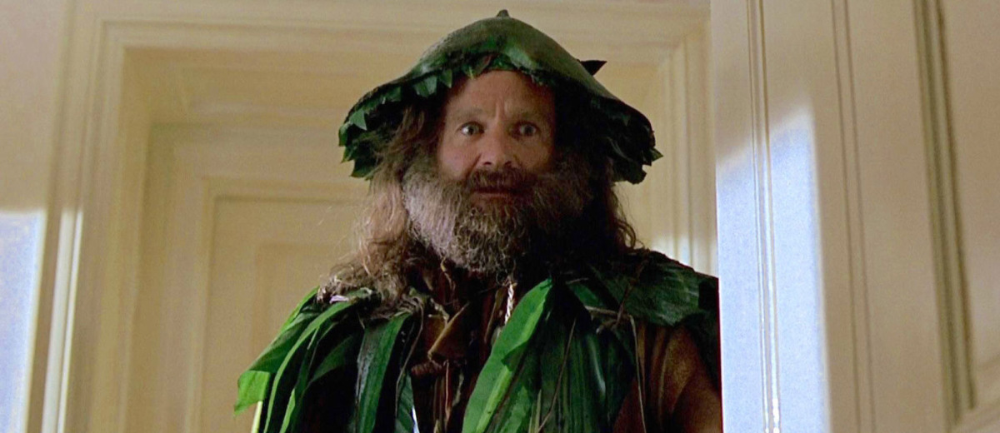

### What makes a "good" movie? Part 1: Box Office and Budget

Let's take look at some Top 10 movies just to get some first impressions. First off, **what's the top 10 in revenue?**

In [88]:
box_office = df.sort_values('revenue_M', ascending=False)
box_office = box_office[:10]
box_office.reset_index(drop=True, inplace=True)
box_office

,original_title,top_billed,sole_director,production_company,genres,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count,company_movie_count
0,Avatar,Sam Worthington,James Cameron,Ingenious Film Partners,Action|Adventure|Fantasy|Science Fiction,162,2009,12,8458,7.1,240.886903,2827.123750,11.736312,7,11,23
1,Star Wars,Mark Hamill,George Lucas,Lucasfilm,Adventure|Action|Science Fiction,121,1977,3,4428,7.9,39.575591,2789.712242,70.490728,4,6,21
2,Titanic,Kate Winslet,James Cameron,Paramount Pictures,Drama|Romance|Thriller,194,1997,11,4654,7.3,271.692064,2506.405735,9.225171,11,11,426
3,The Exorcist,Linda Blair,William Friedkin,Warner Bros.,Drama|Horror|Thriller,122,1973,12,1113,7.2,39.289277,2167.324901,55.163268,5,13,172
4,Jaws,Roy Scheider,Steven Spielberg,Universal Pictures,Horror|Thriller|Adventure,124,1975,6,1415,7.3,28.362748,1907.005842,67.236286,7,29,460
5,Star Wars: The Force Awakens,Harrison Ford,J.J. Abrams,Lucasfilm,Action|Adventure|Science Fiction|Fantasy,136,2015,12,5292,7.5,183.999919,1902.723130,10.340891,30,5,21
6,E.T. the Extra-Terrestrial,Henry Thomas,Steven Spielberg,Universal Pictures,Science Fiction|Adventure|Family|Fantasy,115,1982,4,1830,7.2,23.726245,1791.694309,75.515291,4,29,460
7,The Net,Sandra Bullock,Irwin Winkler,Columbia Pictures,Crime|Drama|Mystery|Thriller|Action,114,1995,7,201,5.6,31.481271,1583.049536,50.285439,24,5,271
8,One Hundred and One Dalmatians,Rod Taylor,Clyde Geronimi,Walt Disney Productions,Adventure|Animation|Comedy|Family,79,1961,1,913,6.6,29.179445,1574.814740,53.970003,2,1,29
9,The Avengers,Robert Downey Jr.,Joss Whedon,Marvel Studios,Science Fiction|Action|Adventure,143,2012,4,8903,7.3,208.943742,1443.191435,6.907081,17,5,27


A decent list, but looking at some quantitative values shows a random distribution. As for genre, seems we have some drama, adevnture, and action movies. **What about the ratio of budget to revenue?**

In [89]:
budget_vs_revenue = df.sort_values('ROI', ascending=False)
budget_vs_revenue = budget_vs_revenue[:10]
budget_vs_revenue.reset_index(drop=True, inplace=True)
budget_vs_revenue

,original_title,top_billed,sole_director,production_company,genres,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count,company_movie_count
0,Mad Max,Mel Gibson,George Miller,Kennedy Miller Productions,Adventure|Action|Thriller|Science Fiction,93,1979,4,667,6.5,1.201822,300.455400,250.000000,28,9,7
1,Halloween,Donald Pleasence,John Carpenter,Compass International Pictures,Horror|Thriller,91,1978,10,522,7.3,1.002810,233.989049,233.333333,6,19,1
2,American Graffiti,Richard Dreyfuss,George Lucas,Lucasfilm,Comedy|Drama,110,1973,8,145,6.5,3.815971,564.783352,148.005148,10,6,21
3,Friday the 13th,Betsy Palmer,Sean S. Cunningham,Paramount Pictures,Horror,95,1980,5,282,6.4,1.455320,158.112870,108.644729,1,2,426
4,Rocky,Sylvester Stallone,John G. Avildsen,United Artists,Drama,119,1976,11,963,7.2,4.214868,449.209682,106.577406,37,11,73
5,Enter the Dragon,Bruce Lee,Robert Clouse,Golden Harvest Company,Crime|Thriller|Action,99,1973,8,279,7.0,4.174486,442.004362,105.882353,3,4,10
6,The Rocky Horror Picture Show,Tim Curry,Jim Sharman,20th Century Fox,Comedy|Horror|Music|Science Fiction,100,1975,8,332,7.1,4.862185,457.419488,94.076933,5,1,88
7,Saw,Cary Elwes,James Wan,Twisted Pictures,Horror|Mystery|Crime,103,2004,10,1135,7.1,1.385334,119.960348,86.593058,5,8,5
8,Dawn of the Dead,David Emge,George A. Romero,Laurel Group,Horror,127,1978,9,306,7.2,2.172755,183.848538,84.615385,1,12,2
9,48 Hrs.,Nick Nolte,Walter Hill,Paramount Pictures,Thriller|Action|Comedy|Crime|Drama,96,1982,12,171,6.1,2.259642,178.214625,78.868508,10,18,426


A lot of 70s movies and they seem to be more on the horror/thriller side of things. Let's use some basic stats to see any quantitative differences.

In [90]:
box_office.describe()

,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count,company_movie_count
count,10.000000,10.000000,10.0000,10.000000,10.000000,10.000000,10.000000,10.000000,10.0000,10.000000,10.000000
mean,131.000000,1989.600000,7.2000,3720.700000,7.100000,109.713721,2049.304562,41.087047,11.1000,11.500000,191.000000
std,30.872498,18.649993,4.2374,3146.446251,0.618241,102.905186,504.874248,28.230451,9.5038,9.902301,196.036278
min,79.000000,1961.000000,1.0000,201.000000,5.600000,23.726245,1443.191435,6.907081,2.0000,1.000000,21.000000
25%,116.500000,1975.500000,4.0000,1188.500000,7.125000,29.754901,1635.210730,10.689746,4.2500,5.000000,24.000000
50%,123.000000,1988.500000,6.5000,3129.000000,7.250000,39.432434,1904.864486,52.127721,7.0000,8.500000,100.500000
75%,141.250000,2006.000000,11.7500,5132.500000,7.300000,202.707786,2421.635527,64.218031,15.5000,12.500000,387.250000
max,194.000000,2015.000000,12.0000,8903.000000,7.900000,271.692064,2827.123750,75.515291,30.0000,29.000000,460.000000


In [91]:
budget_vs_revenue.describe()

,runtime,release_year,release_month,vote_count,vote_average,budget_M,revenue_M,ROI,top_billed_movie_count,director_movie_count,company_movie_count
count,10.000000,10.000000,10.000000,10.00000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,103.300000,1979.800000,8.500000,480.20000,6.840000,2.654519,308.799771,129.659685,10.600000,9.000000,105.900000
std,11.842016,8.991354,2.505549,339.69555,0.422164,1.462234,156.975672,62.214641,12.139925,6.164414,171.430874
min,91.000000,1973.000000,4.000000,145.00000,6.100000,1.002810,119.960348,78.868508,1.000000,1.000000,1.000000
25%,95.250000,1975.250000,8.000000,279.75000,6.500000,1.402831,179.623103,88.464026,3.500000,4.500000,5.500000
50%,99.500000,1978.000000,8.500000,319.00000,7.050000,2.216199,267.222224,106.229880,5.500000,8.500000,15.500000
75%,108.250000,1979.750000,10.000000,630.75000,7.175000,4.084857,447.408352,138.165043,10.000000,11.750000,84.250000
max,127.000000,2004.000000,12.000000,1135.00000,7.300000,4.862185,564.783352,250.000000,37.000000,19.000000,426.000000


Definitely some interesting points for our Top 10 movies: 

>Look at the means
- Difference in range of years
    - One shows about 19 years span (if we use standard deviation that way) and the other about 9 and being very specific to the 70s. 
    - One has a mean year of about 1990 and the other 1980
- Difference in release months
    - By revenue only, we could say these are more Summer Blockbusters with an average release month of 7, or July, while the other shows more of the popular movies of Fall - scary movies make sense
- Differences in vote coutns
    - Looks like horror/thriller movies aren't voted on as much as a general popular movie
- Budgets and revenues are drastically different
- ROI is much larger for the latter than the prior: the stereotype of low-budget films having a decent pay-off

**Can we see this overall?**

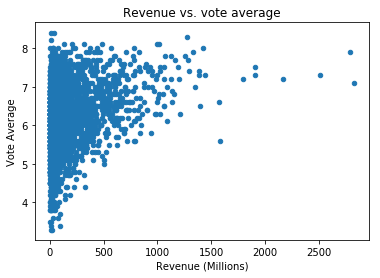

In [95]:
df[['vote_average','revenue_M']].plot.scatter(x='revenue_M',y='vote_average')
plt.ylabel("Vote Average")
plt.xlabel("Revenue (Millions)")
plt.title("Revenue vs. vote average")
plt.show()

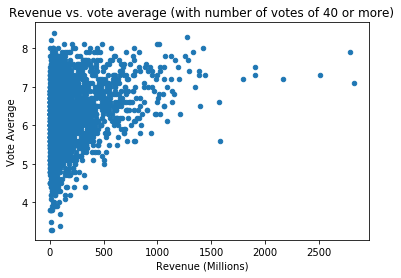

In [96]:
ratings_df[['vote_average','revenue_M']].plot.scatter(x='revenue_M',y='vote_average')
plt.ylabel("Vote Average")
plt.xlabel("Revenue (Millions)")
plt.title("Revenue vs. vote average (with number of votes of 40 or more)")
plt.show()

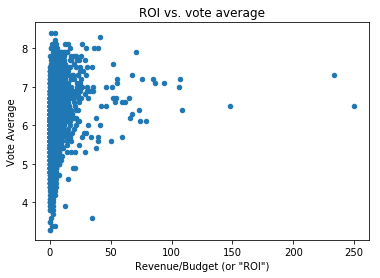

In [97]:
df[['vote_average','ROI']].plot.scatter(x='ROI',y='vote_average')
plt.ylabel("Vote Average")
plt.xlabel("Revenue/Budget (or \"ROI\")")
plt.title("ROI vs. vote average")
plt.show()

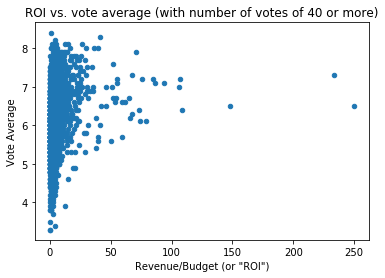

In [98]:
ratings_df[['vote_average','ROI']].plot.scatter(x='ROI',y='vote_average')
plt.ylabel("Vote Average")
plt.xlabel("Revenue/Budget (or \"ROI\")")
plt.title("ROI vs. vote average (with number of votes of 40 or more)")
plt.show()

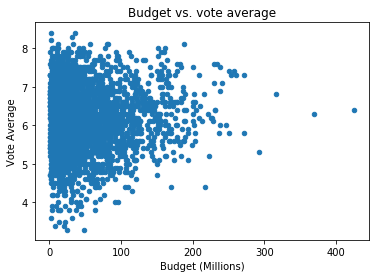

In [99]:
df[['vote_average','budget_M']].plot.scatter(x='budget_M',y='vote_average')
plt.ylabel("Vote Average")
plt.xlabel("Budget (Millions)")
plt.title("Budget vs. vote average")
plt.show()

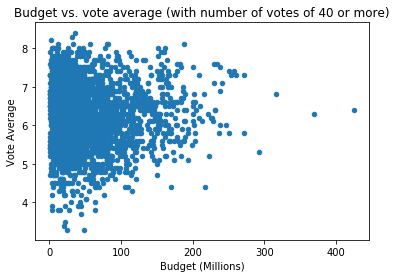

In [100]:
ratings_df[['vote_average','budget_M']].plot.scatter(x='budget_M',y='vote_average')
plt.ylabel("Vote Average")
plt.xlabel("Budget (Millions)")
plt.title("Budget vs. vote average (with number of votes of 40 or more)")
plt.show()

It shouldn't be too surprising that box office revenue is defintiely related to good ratings. Just keep in mind that the raitngs on TMDB have nothing to do with recording ratings given at theaters as the movie was shown - not that, as far as I know, such a live rating system exists. It's clear, though, ROI and budget don't really show "good" movies. At this point, revenue is our cornerstone, for good or ill, as we analysze some other relationships. (Notice, for this purpose, using filtered ratings does not affect the general picture that much.)

### What makes a "good" movie? Part 2: The people and the company

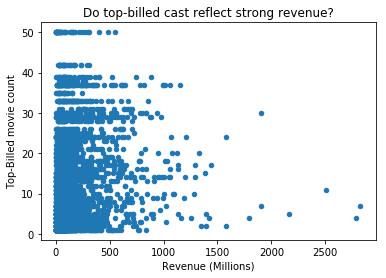

In [101]:
df[['top_billed_movie_count','revenue_M']].plot.scatter(x='revenue_M',y='top_billed_movie_count')
plt.ylabel("Top-Billed movie count")
plt.xlabel("Revenue (Millions)")
plt.title("Do top-billed cast reflect strong revenue?")
plt.show()

Hmm... Seems like we have a negative relationship, sort of. At 50, it's Nicolas Cage, and each film doesn't have a big box office response. Less is more? Maybe? It seems like actors/actresses who appear at most 30 times see a bigger hit. At least, given this data and the paces we've gone through, this is what we can conclude. (Remember, we don't include actors/actresses who were second, third, and so on, in the line up. But the main point was the "top-billed": Do they make a difference in the success of the film?)

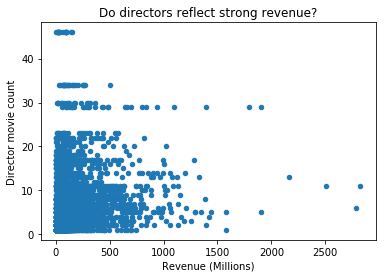

In [102]:
df[['director_movie_count','revenue_M']].plot.scatter(x='revenue_M',y='director_movie_count')
plt.ylabel("Director movie count")
plt.xlabel("Revenue (Millions)")
plt.title("Do directors reflect strong revenue?")
plt.show()

This has some intersting qualities about it. 30 is not doing too bad. But it's a bit mixed less than 30.

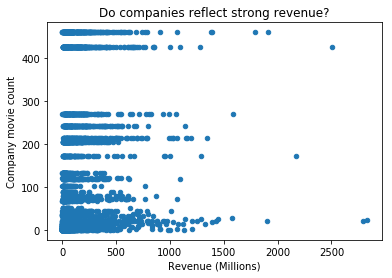

In [103]:
df[['company_movie_count','revenue_M']].plot.scatter(x='revenue_M',y='company_movie_count')
plt.ylabel("Company movie count")
plt.xlabel("Revenue (Millions)")
plt.title("Do companies reflect strong revenue?")
plt.show()

Wow! Just about no difference what company it is. You can definitely see a slight positive incline, but below 50 movies definitely has its fair share of success. A movie can be a hit no matter what company it is made from!

<a id='conclusions'></a>
## Conclusions

Well, folks, I would like to see something with genre. However, I believe given my current skill set and a suspicion that how the distribution is for some genres, we may get skewed/misleading results. Drama in particular is the most common. But how do we weigh in the ~2000 combinations fairly? Let's recap on the limitations:

> Notable mentions
- Too many names or categories in a given column resulted in a more pragmatic use possibly losing some value/insight
- Infaltion-adjusted budget and revenue values, especially 0 values, may not be accurate resulting in subjective cut-offs
- Most other columns seemed to have no easy or immediate value to the analysis and were dropped: id, imdb_id, popularity, budget, revenue, homepage, tagline, overview

If this were an extensive dataset, it would be more interesting to go through the decades and see how trends change of what makes a movie interesting to the public. For example, westerns were big in the 50s and 60s, along with an emerging interest in sci-fi as science and engineering were heavily supported for the Cold War effort. Perhaps some fancy footwork with natural language processing or other forms of machine/deep learning may help quantify the the plethora of text involved here.

Given this dataset, it's not clear what attributes could determine a "good" movie. Instead, it's retrospective: Did it hit high box-office sales? I'm sure there are ways, with more data, to find a more predictive indicator that a movie could be "good."

...All in all, a good movie is whatever you like, because "movies are your best entertainment." ("The Errand Boy" (1961))

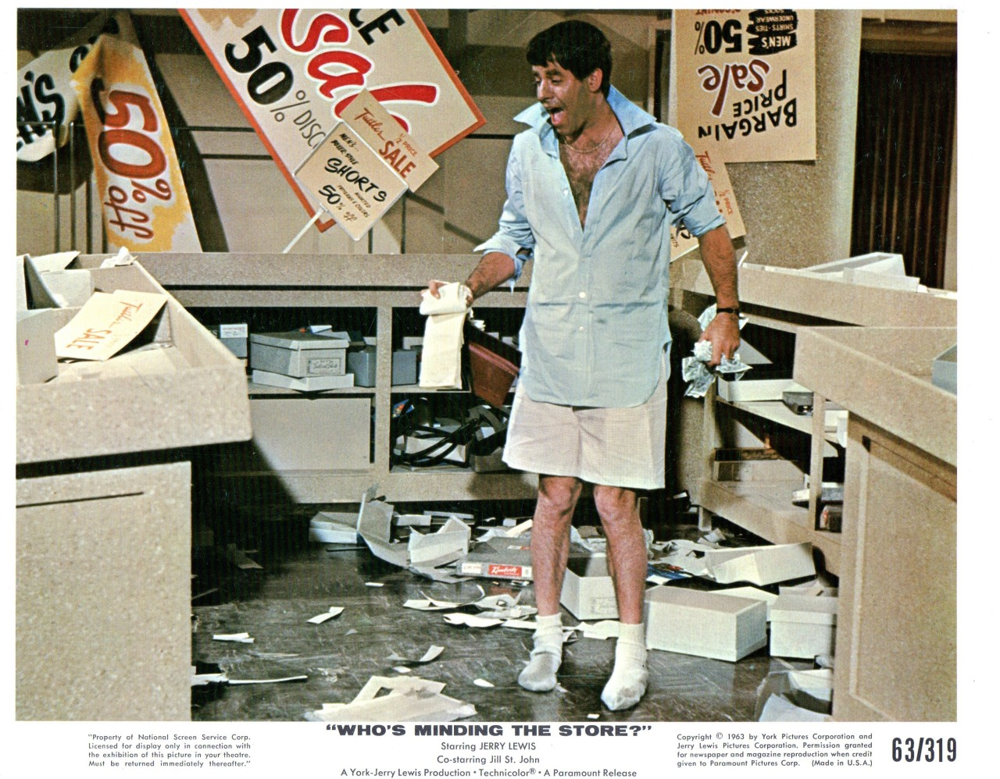

## Submitting your Project 

> Before you submit your project, you need to create a .html or .pdf version of this notebook in the workspace here. To do that, run the code cell below. If it worked correctly, you should get a return code of 0, and you should see the generated .html file in the workspace directory (click on the orange Jupyter icon in the upper left).

> Alternatively, you can download this report as .html via the **File** > **Download as** submenu, and then manually upload it into the workspace directory by clicking on the orange Jupyter icon in the upper left, then using the Upload button.

> Once you've done this, you can submit your project by clicking on the "Submit Project" button in the lower right here. This will create and submit a zip file with this .ipynb doc and the .html or .pdf version you created. Congratulations!

In [ ]:
from subprocess import call
call(['python', '-m', 'nbconvert', 'Investigate_a_Dataset.ipynb'])